In [ ]:
import os
import sys
import json
import argparse

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib

from glob import glob
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm.second_level import make_second_level_design_matrix
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img

In [ ]:
from nilearn import plotting, datasets, surface

# for plotting slices
mni152_template = datasets.load_mni152_template(resolution=1)
# for plotting on surface
fsaverage = datasets.fetch_surf_fsaverage('fsaverage')

In [ ]:
task_label = 'badaga'
fwhm = 6.00
space_label = 'MNI152NLin2009cAsym'

# define data directories
bidsroot = os.path.join('/bgfs/bchandrasekaran/krs228/data/', 
                        'SSP/',
                        'data_bids',
                       )
nilearn_dir = os.path.join(bidsroot, 'derivatives', 'nilearn')

# define first-level directory where group-level inputs will be pulled from
l1_dir = os.path.join(nilearn_dir, 'run-all')

# create output directory
group_out_dir = os.path.join(nilearn_dir, 'group_run-all')
if not os.path.exists(group_out_dir):
        os.makedirs(group_out_dir)

# Plot first-level images

In [ ]:
'''
sub_list = ['sub-SSP009', 'sub-SSP011', 
            'sub-SSP017', 'sub-SSP018',
            'sub-SSP020', 
           ]
'''

In [ ]:
sub_list = [os.path.basename(x) for x in sorted(glob(l1_dir+'/sub*'))]
print(sub_list)

# Group-level analyses

Based on [nilearn documentation](https://nilearn.github.io/stable/auto_examples/05_glm_second_level/plot_thresholding.html#statistical-testing-of-a-second-level-analysis)

### Build the group-level design matrix

**CAUTION! Groups not accurate as of 02/13/2025** 

#### Read the `participants.tsv` file from the BIDS root directory

In [ ]:
participants_fpath = os.path.join(bidsroot, 'participants.tsv')
participants_df = pd.read_csv(participants_fpath, sep='\t')

# subjects to ignore (not fully processed, etc.)
ignore_subs = ['sub-SSP001', 'sub-SSP002',
               'sub-SSP005', 'sub-SSP012',
               'sub-SSP013', 'sub-SSP014',
               'sub-SSP040', 
               'sub-SSP069', 'sub-SSP072',
               ]
participants_df.drop(participants_df[participants_df.participant_id.isin(ignore_subs)].index, inplace=True)

# re-sort by participant ID
participants_df.sort_values(by=['participant_id'], ignore_index=True, inplace=True)

In [ ]:
print(participants_df)

In [ ]:
# create group-specific lists of subject IDs
sub_list_cwns = list(participants_df.participant_id[participants_df.group=='control'])#'CWNS'])
sub_list_cws = list(participants_df.participant_id[participants_df.group=='CWS'])

#### Create design matrixes

In [ ]:
# get participant IDs and their group labels
subjects_label = list(participants_df.participant_id)
groups_label = list(participants_df.group)

# make new dataframe from the group labels
design_mat_groupdiff = pd.DataFrame({'CWS': groups_label,
                                     'CWNS': groups_label,
                                    }
                                   )
# convert to 1s and 0s for each group as appropriate
design_mat_groupdiff['CWS'].loc[design_mat_groupdiff['CWS'] == 'CWS'] = 1
design_mat_groupdiff['CWS'].loc[design_mat_groupdiff['CWS'] == 'control'] = 0
design_mat_groupdiff['CWNS'].loc[design_mat_groupdiff['CWNS'] == 'CWS'] = 0
design_mat_groupdiff['CWNS'].loc[design_mat_groupdiff['CWNS'] == 'control'] = 1
design_mat_groupdiff = design_mat_groupdiff.astype('int')
print(design_mat_groupdiff)

## contrast-sound

### Get files

In [ ]:
contrast_label = 'sound'

In [ ]:
print(l1_dir)

In [ ]:
sub_list_cwns

In [ ]:
# get the beta map for the contrast of interest for each subject
l1_fnames_mand = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-effect_statmap.nii.gz'))[0] for sub_id in sub_list_cwns]
l1_fnames_nman = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-effect_statmap.nii.gz'))[0] for sub_id in sub_list_cws]
l1_fnames_groupdiff = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-effect_statmap.nii.gz'))[0] for sub_id in subjects_label]

In [ ]:
len(l1_fnames_groupdiff)

In [ ]:
print(l1_fnames_groupdiff)

### Plot subject stat images for validation

In [ ]:
z_fnames_groupdiff = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-z_statmap.nii.gz'))[0] for sub_id in subjects_label]

In [ ]:
[plotting.plot_stat_map(x) for x in z_fnames_groupdiff]

### CWNS speaking group

#### Using combined GLM, with contrast isolating CWNS group

In [ ]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[0, 1], output_type='z_score')

In [ ]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = None # 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [ ]:
'''
group_label = 'CWNS'
z_fpath   = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_map-zstat.nii.gz'.format(group_label, space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(group_label, space_label, 
                                                                                                                contrast_label, alpha, 
                                                                                                                cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)
'''

In [ ]:
plot_title = (f'CWNS group (n={len(sub_list_cwns)})\n'
              f'{contrast_label} > baseline {cluster_correct}-corrected z map \n'
              f'p < {alpha}, clusters > {cthresh} voxels')

In [ ]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
#fig.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-ortho.png'.format(group_label, space_label, contrast_label)))

Interactive viewer:

In [ ]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title=f'CWNS {contrast_label} > baseline')

Test lower threshold:

In [ ]:
plotting.view_img(z_map, 
                  threshold=2, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title=f'CWNS {contrast_label} > baseline')

#### Surface plots:

In [ ]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=2, #zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()
#fig2.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-surface.png'.format(group_label, space_label, contrast_label)))

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
#fig1.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-axial-subcort.png'.format(group_label, space_label, contrast_label)))

### Group differences

In [ ]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, -1], output_type='z_score')

In [ ]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [ ]:
group_label = 'Mand-vs-NMan'
z_fpath   = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_map-zstat.nii.gz'.format(group_label, space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(group_label, space_label, 
                                                                                                                contrast_label, alpha, 
                                                                                                                cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)

In [ ]:
plot_title = ('Mand (n=%d) vs. NMan (n=%d) group differences\n'
              '%s > baseline FDR-corrected z map \n'
              'p < %.02f, clusters > %d voxels'%(len(sub_list_mand), len(sub_list_nman), 
                                                 contrast_label, alpha, cthresh))

In [ ]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
fig.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-ortho.png'.format(group_label, space_label, contrast_label)))

Interactive viewer:

In [ ]:
plotting.view_img(z_map, #thresholded_map, 
                  threshold=2., # threshold
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title='Mand > NMan sound > baseline')

### All participants

In [ ]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, 1], output_type='z_score')

In [ ]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = None # 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [ ]:
'''
group_label = 'all'
z_fpath   = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_map-zstat.nii.gz'.format(group_label, space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(group_label, space_label, 
                                                                                                                contrast_label, alpha, 
                                                                                                                cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)
'''

In [ ]:
plot_title = (#f'CWNS group (n={len(sub_list_cwns)})\n'
              f'All participants (n={len(sub_list_cwns)})\n'
              f'{contrast_label} > baseline {cluster_correct}-corrected z map \n'
              f'p < {alpha}, clusters > {cthresh} voxels')

The None=0.05 threshold is 3


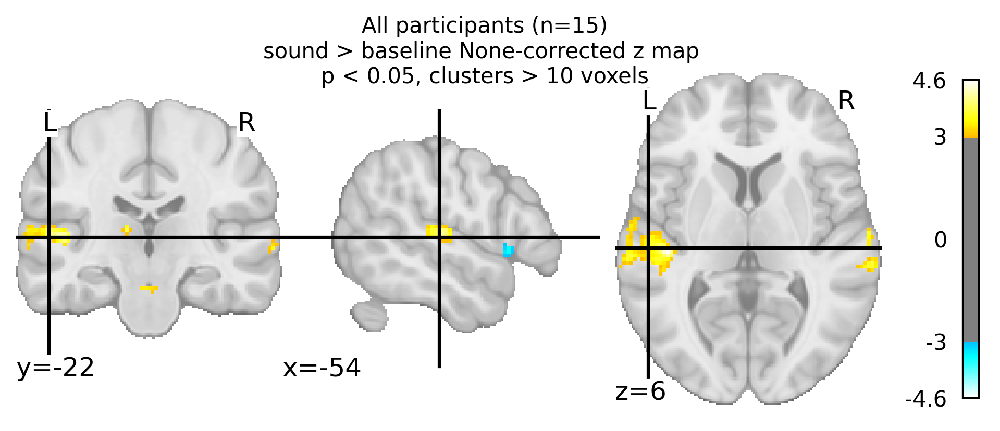

In [23]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
#fig.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-ortho.png'.format(group_label, space_label, contrast_label)))

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



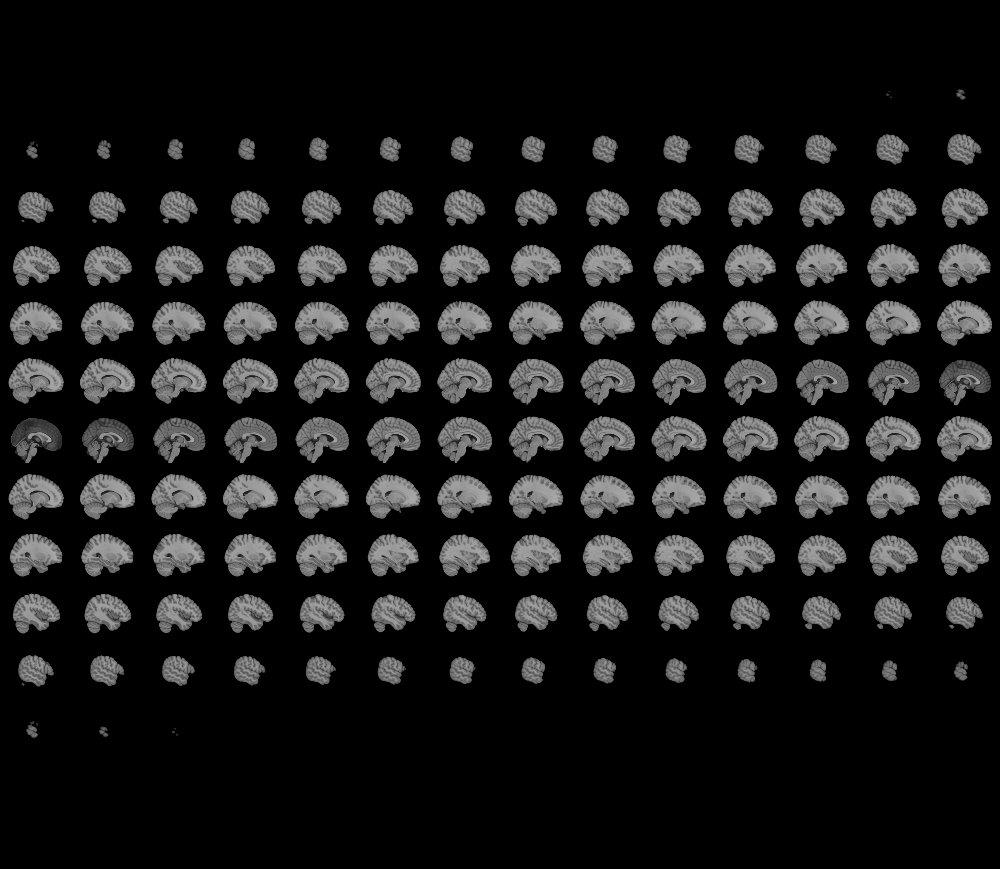
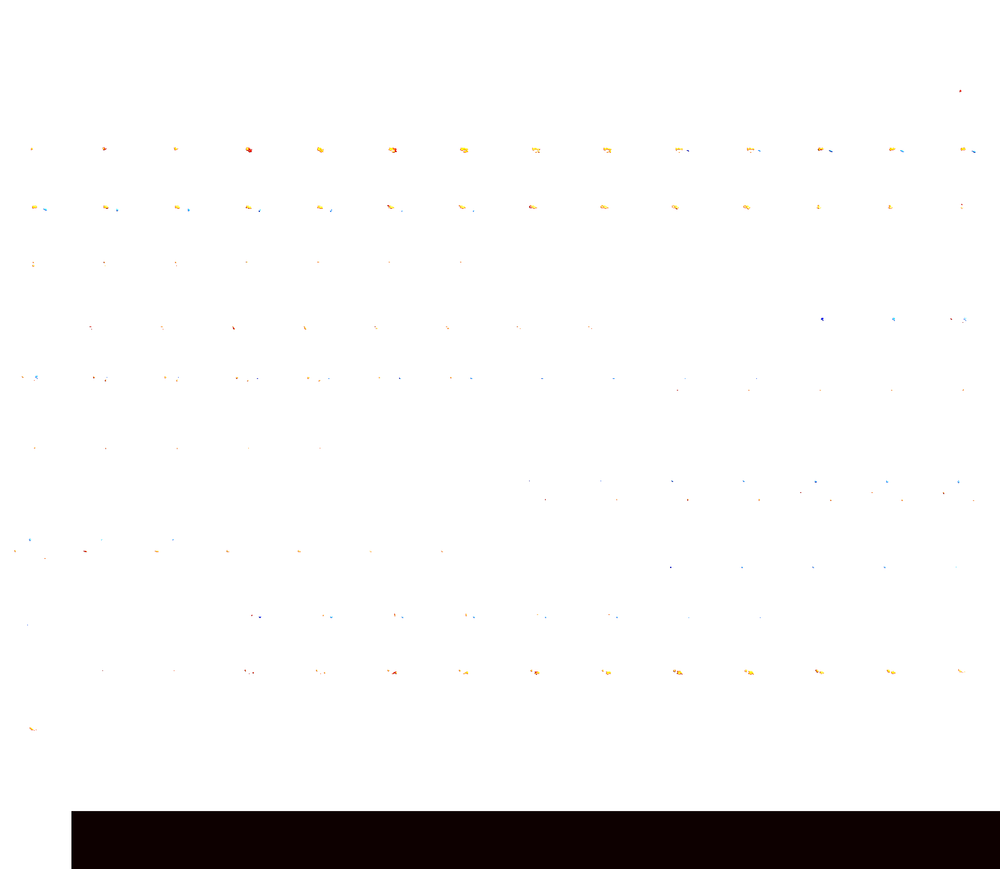

In [24]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title=f'group-all {contrast_label} > baseline')

Test lower threshold:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



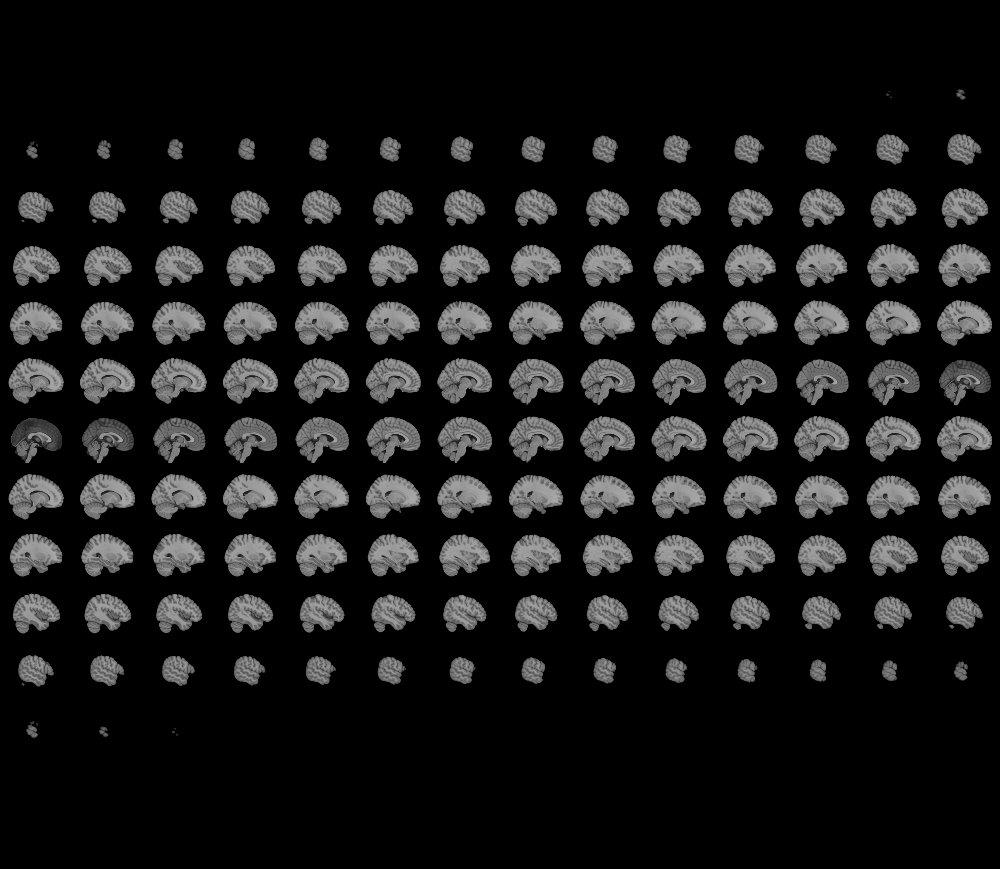
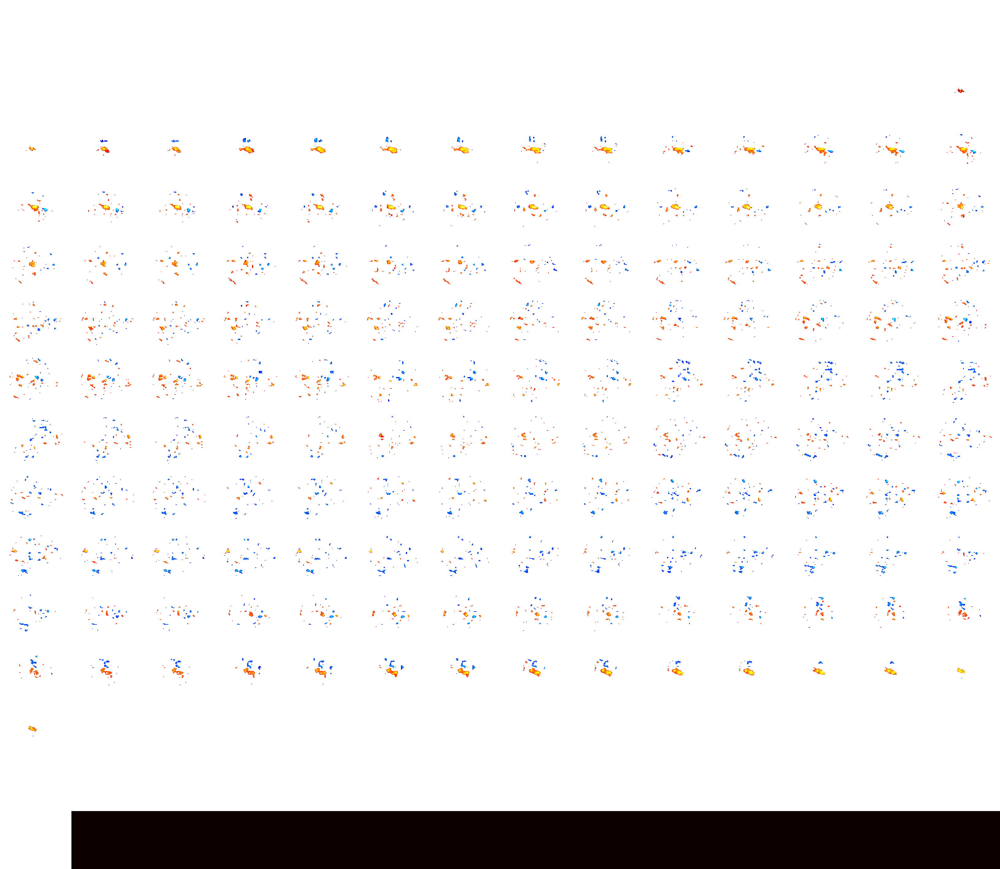

In [25]:
plotting.view_img(z_map, 
                  threshold=2, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title=f'group-all {contrast_label} > baseline')

#### Surface plots:

In [ ]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=2, #zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            #fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            #fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            #fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            #fig=fig2
                            )
fig2.tight_layout()
fig2.show()
#fig2.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-surface.png'.format(group_label, space_label, contrast_label)))

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
#fig1.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-axial-subcort.png'.format(group_label, space_label, contrast_label)))

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()
fig2.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-surface.png'.format(group_label, space_label, contrast_label)))

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
fig1.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-axial-subcort.png'.format(group_label, space_label, contrast_label)))

## contrast-response

### Get files

In [26]:
contrast_label = 'response'

In [27]:
print(l1_dir)

/bgfs/bchandrasekaran/krs228/data/SSP/data_bids/derivatives/nilearn/run-all


In [29]:
# get the beta map for the contrast of interest for each subject
l1_fnames_mand = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-effect_statmap.nii.gz'))[0] for sub_id in sub_list_cwns]
l1_fnames_nman = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-effect_statmap.nii.gz'))[0] for sub_id in sub_list_cws]
l1_fnames_groupdiff = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-effect_statmap.nii.gz'))[0] for sub_id in subjects_label]

In [30]:
len(l1_fnames_groupdiff)

15

In [31]:
print(l1_fnames_groupdiff)

['/bgfs/bchandrasekaran/krs228/data/SSP/data_bids/derivatives/nilearn/run-all/sub-SSP009/sub-SSP009_task-badaga_fwhm-6_contrast-response_stat-effect_statmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/SSP/data_bids/derivatives/nilearn/run-all/sub-SSP011/sub-SSP011_task-badaga_fwhm-6_contrast-response_stat-effect_statmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/SSP/data_bids/derivatives/nilearn/run-all/sub-SSP017/sub-SSP017_task-badaga_fwhm-6_contrast-response_stat-effect_statmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/SSP/data_bids/derivatives/nilearn/run-all/sub-SSP018/sub-SSP018_task-badaga_fwhm-6_contrast-response_stat-effect_statmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/SSP/data_bids/derivatives/nilearn/run-all/sub-SSP020/sub-SSP020_task-badaga_fwhm-6_contrast-response_stat-effect_statmap.nii.gz', '/bgfs/bchandrasekaran/krs228/data/SSP/data_bids/derivatives/nilearn/run-all/sub-SSP028/sub-SSP028_task-badaga_fwhm-6_contrast-response_stat-effect_statmap.nii.gz', '/bgfs/bc

### Plot subject stat images for validation

In [32]:
z_fnames_groupdiff = [sorted(glob(l1_dir+f'/{sub_id}/{sub_id}_task-{task_label}_fwhm-6_'+
                             f'contrast-{contrast_label}_stat-z_statmap.nii.gz'))[0] for sub_id in subjects_label]

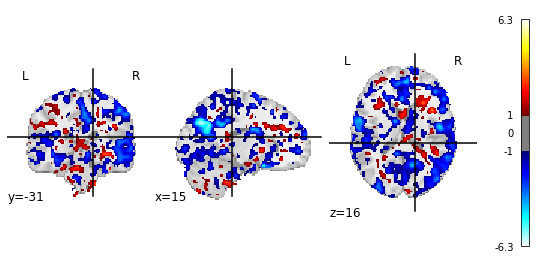

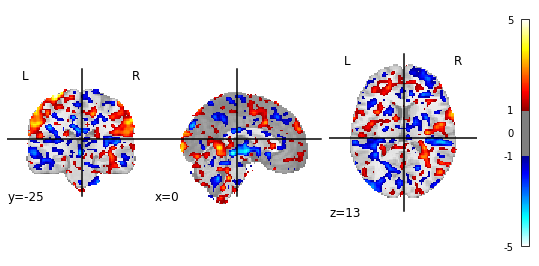

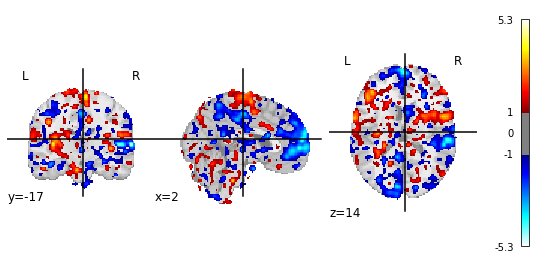

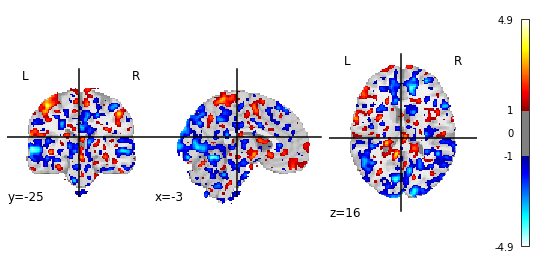

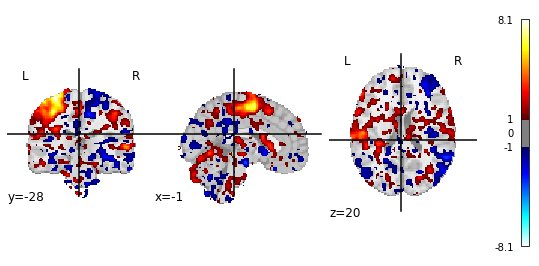

...

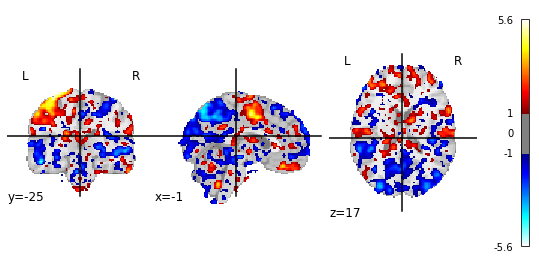

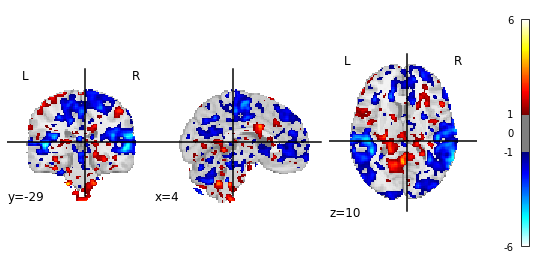

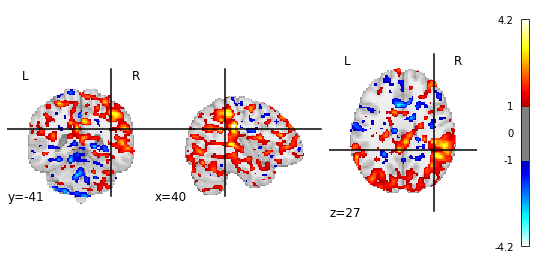

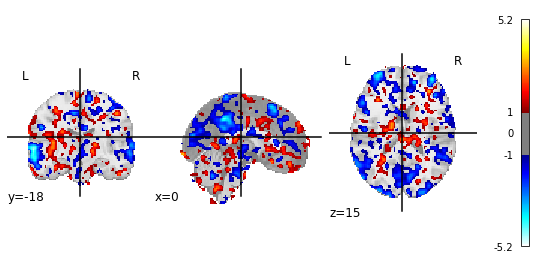

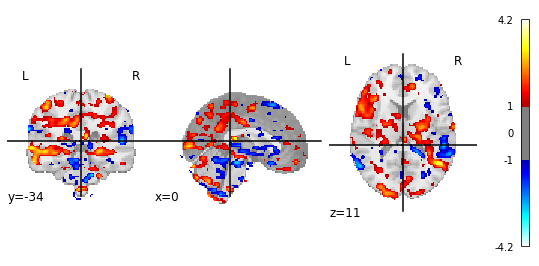

In [47]:
[plotting.plot_stat_map(x, threshold=1) for x in z_fnames_groupdiff]

### CWNS speaking group

#### Using combined GLM, with contrast isolating CWNS group

In [ ]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[0, 1], output_type='z_score')

In [ ]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = None # 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [ ]:
'''
group_label = 'CWNS'
z_fpath   = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_map-zstat.nii.gz'.format(group_label, space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(group_label, space_label, 
                                                                                                                contrast_label, alpha, 
                                                                                                                cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)
'''

In [ ]:
plot_title = (f'CWNS group (n={len(sub_list_cwns)})\n'
              f'{contrast_label} > baseline {cluster_correct}-corrected z map \n'
              f'p < {alpha}, clusters > {cthresh} voxels')

In [ ]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
#fig.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-ortho.png'.format(group_label, space_label, contrast_label)))

Interactive viewer:

In [ ]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title=f'CWNS {contrast_label} > baseline')

Test lower threshold:

In [ ]:
plotting.view_img(z_map, 
                  threshold=2, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title=f'CWNS {contrast_label} > baseline')

#### Surface plots:

In [ ]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=2, #zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()
#fig2.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-surface.png'.format(group_label, space_label, contrast_label)))

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
#fig1.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-axial-subcort.png'.format(group_label, space_label, contrast_label)))

### Group differences

In [ ]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, -1], output_type='z_score')

In [ ]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [ ]:
group_label = 'Mand-vs-NMan'
z_fpath   = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_map-zstat.nii.gz'.format(group_label, space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(group_label, space_label, 
                                                                                                                contrast_label, alpha, 
                                                                                                                cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)

In [ ]:
plot_title = ('Mand (n=%d) vs. NMan (n=%d) group differences\n'
              '%s > baseline FDR-corrected z map \n'
              'p < %.02f, clusters > %d voxels'%(len(sub_list_mand), len(sub_list_nman), 
                                                 contrast_label, alpha, cthresh))

In [ ]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
fig.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-ortho.png'.format(group_label, space_label, contrast_label)))

Interactive viewer:

In [ ]:
plotting.view_img(z_map, #thresholded_map, 
                  threshold=2., # threshold
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title='Mand > NMan sound > baseline')

### All participants

In [34]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, 1], output_type='z_score')

In [36]:
plot_title = (f'All participants (n={len(subjects_label)})\n'
              f'{contrast_label} > baseline {cluster_correct}-corrected z map \n'
              f'p < {alpha}, clusters > {cthresh} voxels')

In [37]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = None # 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [ ]:
'''
group_label = 'all'
z_fpath   = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_map-zstat.nii.gz'.format(group_label, space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-{}_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(group_label, space_label, 
                                                                                                                contrast_label, alpha, 
                                                                                                                cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)
'''

The None=0.05 threshold is 3


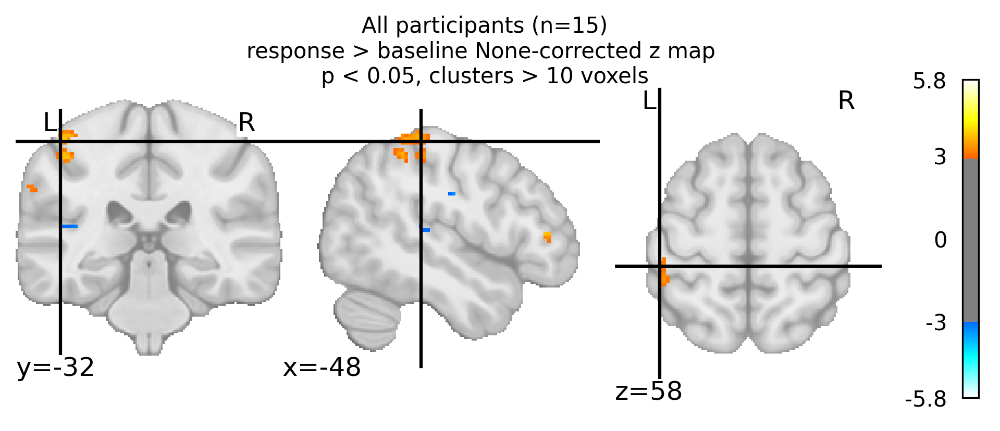

In [43]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-48, -32, 58],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
#fig.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-ortho.png'.format(group_label, space_label, contrast_label)))

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



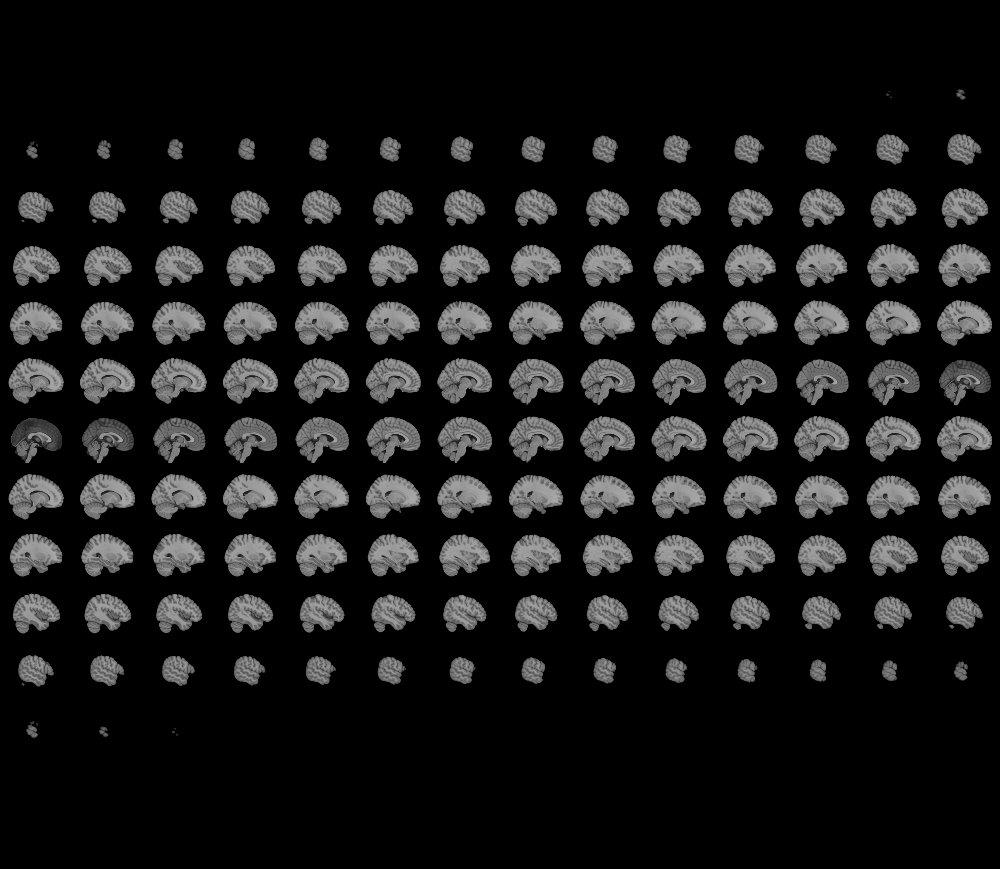
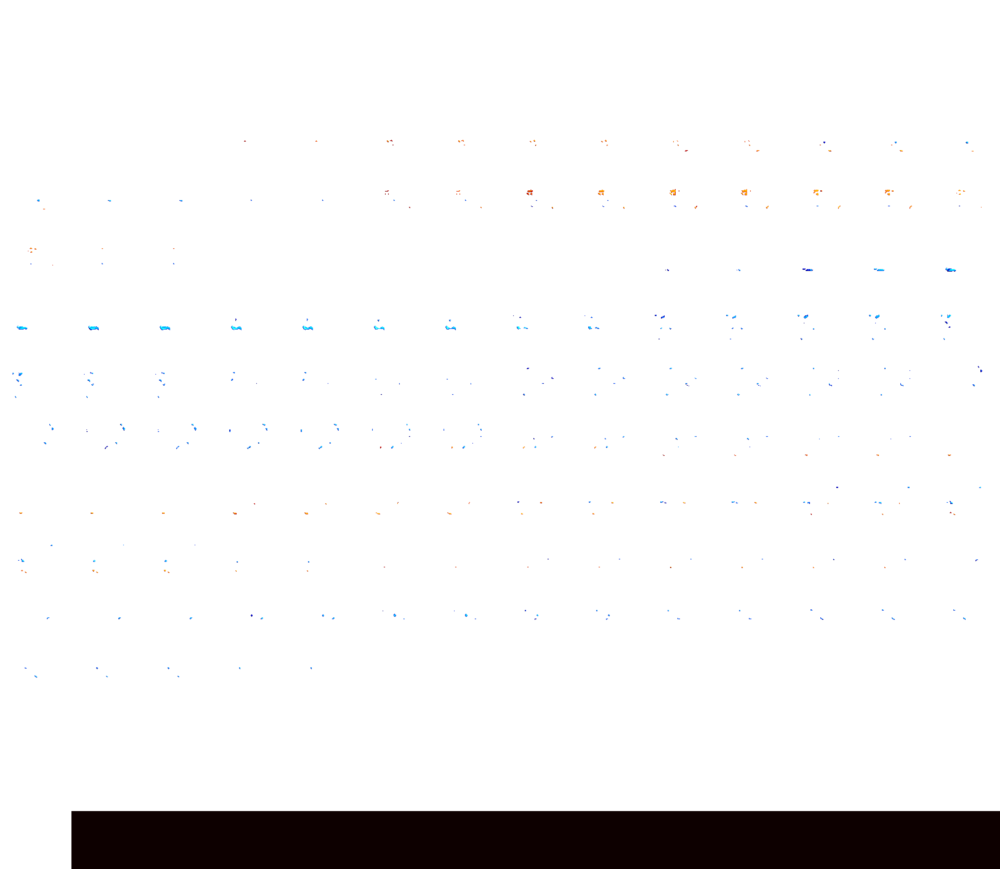

In [44]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-48, -32, 58],
                  title=f'group-all {contrast_label} > baseline')

Test lower threshold:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:103: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



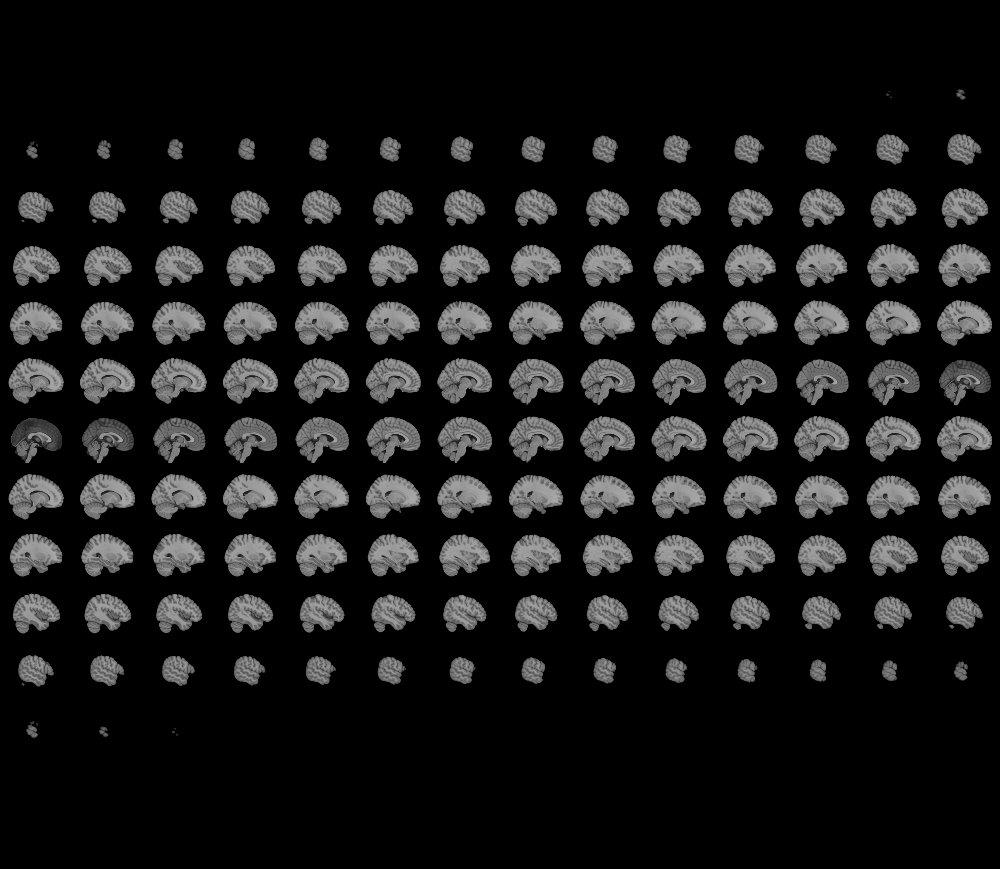
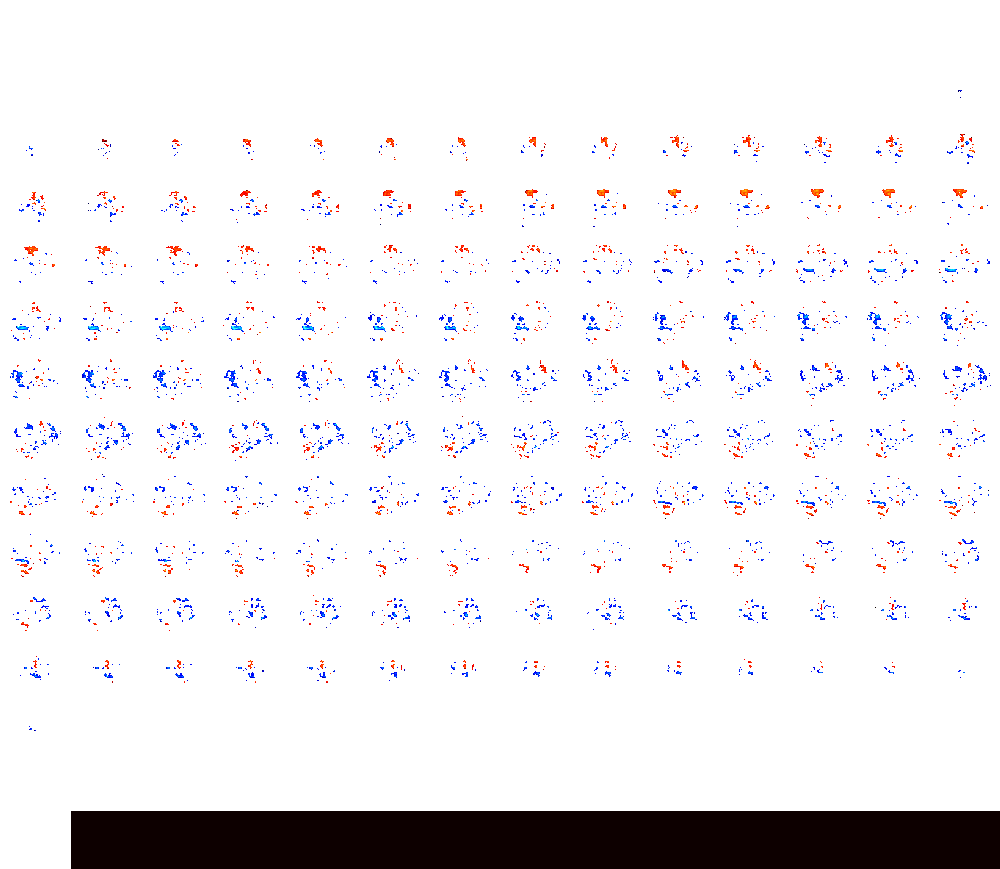

In [45]:
plotting.view_img(z_map, 
                  threshold=2, 
                  bg_img=mni152_template,
                  cut_coords=[-48, -32, 58],
                  title=f'group-all {contrast_label} > baseline')

#### Surface plots:

In [ ]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=2, #zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            #fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            #fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            #fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            #fig=fig2
                            )
fig2.tight_layout()
fig2.show()
#fig2.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-surface.png'.format(group_label, space_label, contrast_label)))

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
#fig1.savefig(os.path.join(group_out_dir,
#                     'group-{}_space-{}_contrast-{}_view-axial-subcort.png'.format(group_label, space_label, contrast_label)))

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()
fig2.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-surface.png'.format(group_label, space_label, contrast_label)))

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)
fig1.savefig(os.path.join(group_out_dir,
                     'group-{}_space-{}_contrast-{}_view-axial-subcort.png'.format(group_label, space_label, contrast_label)))